# Solution of Schrodinger's 1D wave equation for Simple Harmonic Oscillator Potential
Euler Method

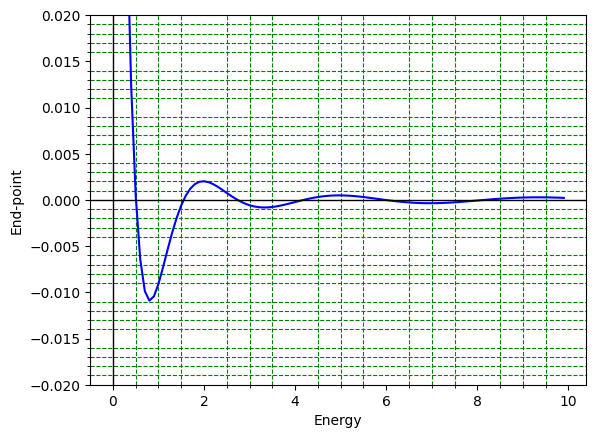

Enter the 1st guess of energy :  1
Enter the 2nd guess of energy :  3


Energy does not exist between the guesses
Enter new guesses


Enter the 1st guess of energy :  1
Enter the 2nd guess of energy :  2


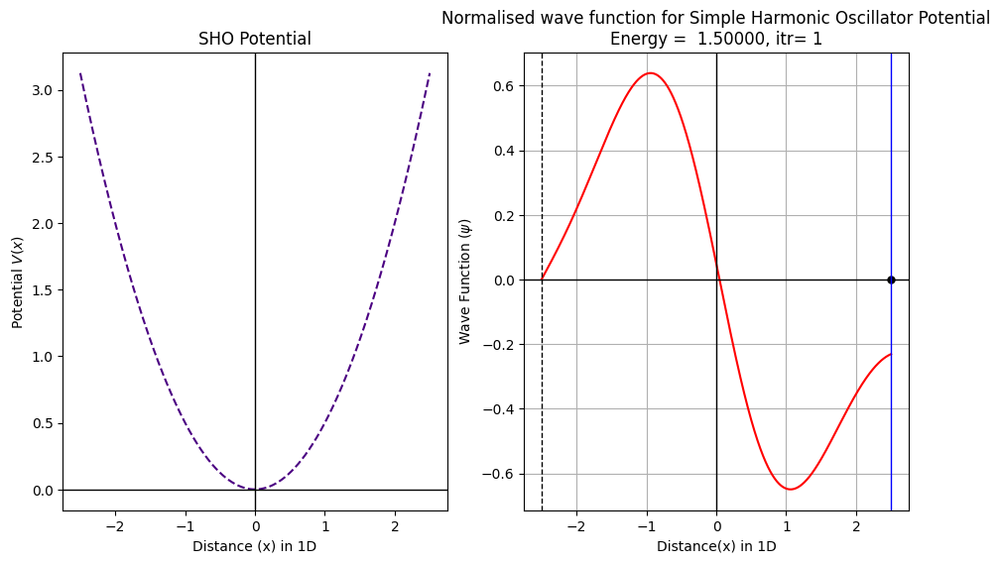

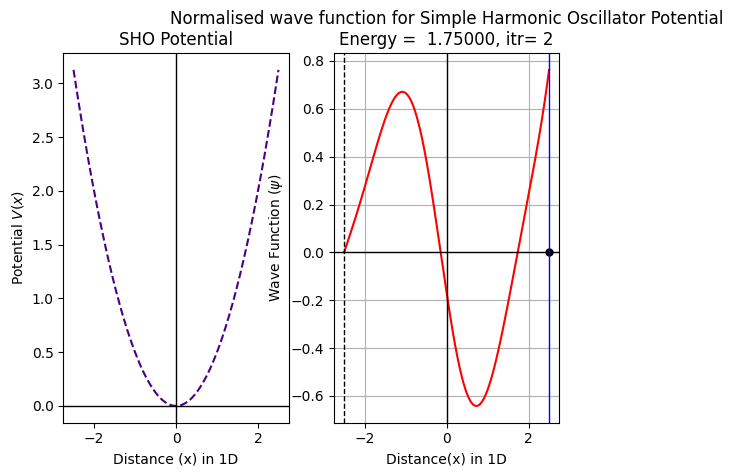

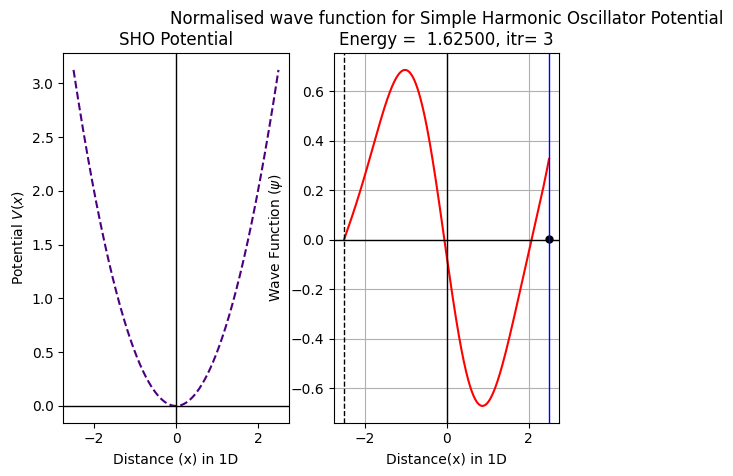

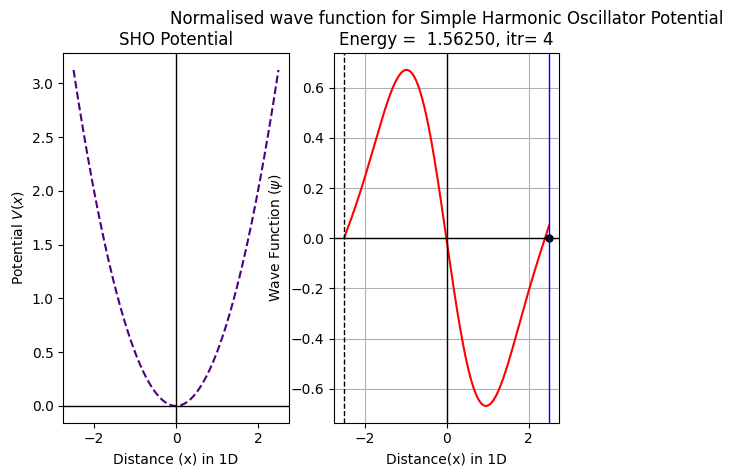

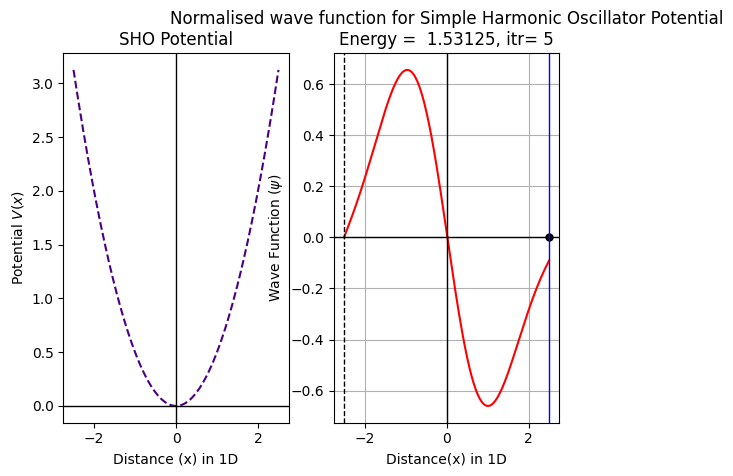

...

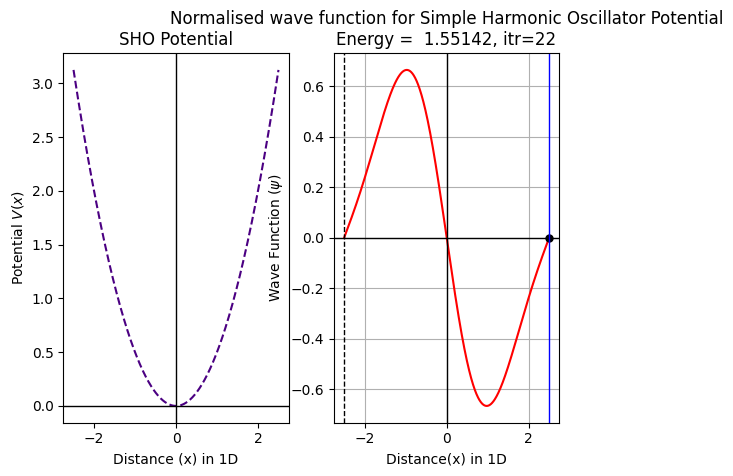

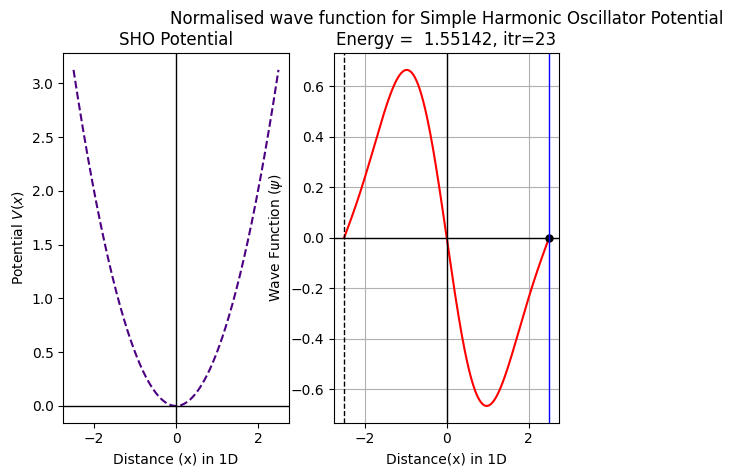

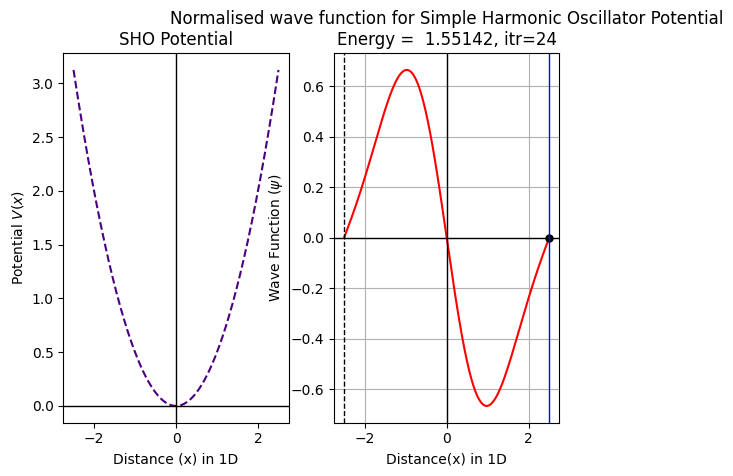

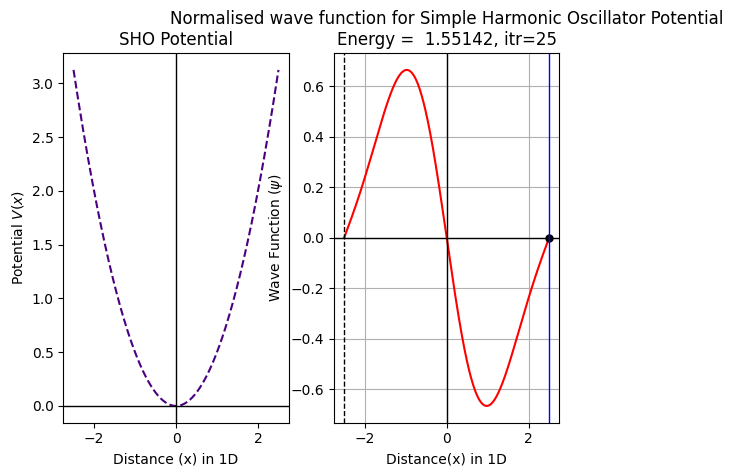

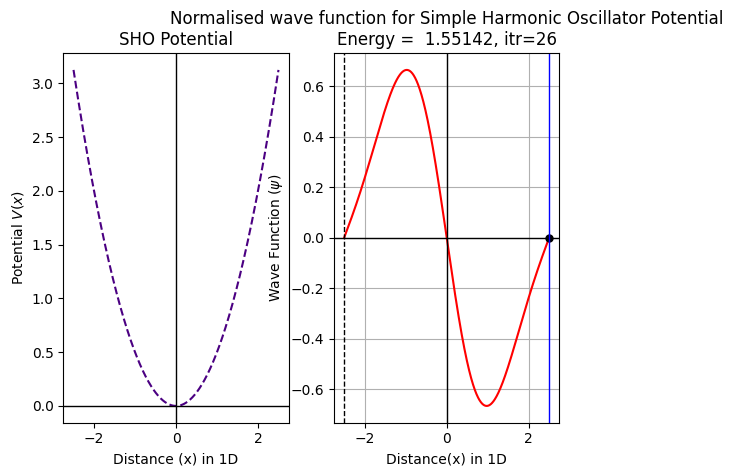

The dimensionless energy satisfying the boundary condition is 1.5514236018061638


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import simpson


#Define the dimensionless potential
def V(x):
    omega=1
    return x**2/2

#Define the dimensionless Time Independent Schrodinger Equation
def psi(x,y,u,E):
    f=-2*(E-V(x))*y
    return f

def phi(x,y,u):
	return u
   
#Boundary conditions for a wave function
x0,y0,xn,yn=-2.5,0,2.5,0
n=1000

#Euler method with shooting parameter E as energy
def SHO(E):
    alpha=0.001          #Initial derivative (can be anything as it doesn't control the solution after normalization)
    x,y,u,X,Y,U=x0,y0,alpha,[x0],[y0],[alpha]
    h=(xn-x0)/n
    for i in range(0,n):   
        y=y+h*phi(x,y,u)
        u=u+h*psi(x,y,u,E)
        x=x+h
        X.append(x)
        Y.append(y)
        U.append(u)
    return X,Y,U


#Guessing dimensionless energy value from plot
energies=np.arange(0,10,0.1)
H=[]
for i in energies:
    hits=SHO(i)[1][-1]
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.ylim(-0.02,0.02)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection method for proper choice of energy
while True:
    E1=eval(input('Enter the 1st guess of energy : '))
    E2=eval(input('Enter the 2nd guess of energy : '))
    if SHO(E1)[1][-1]*SHO(E2)[1][-1]<0:
        break
    print('Energy does not exist between the guesses\nEnter new guesses')

itr=0.0
plt.figure(figsize=(11,6)) 
while True:
    E3=(E1+E2)/2
    if SHO(E3)[1][-1]==0:
        break
    if SHO(E1)[1][-1]*SHO(E3)[1][-1]>0:
        E1=E3
    else:
        E2=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
          
#Normalisation of wave function
    N=1/np.sqrt(simpson(np.array(SHO(E3)[1])*np.array(SHO(E3)[1]),x=np.array(SHO(E3)[0])))
    solution=N*np.array(SHO(E3)[1])

#Plotting and printing
    plt.subplot(121)
    x=np.array(SHO(E3)[0])
    plt.plot(x,V(x),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('SHO Potential')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.plot(np.array(SHO(E3)[0]),solution,'r',lw=1.5)
    plt.plot(SHO(E3)[0][-1],SHO(E3)[1][-1],'o',color='black',ms=5)
    plt.title('Normalised wave function for Simple Harmonic Oscillator Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.axvline(x=xn,color='blue',lw=1)
    plt.grid()
    plt.pause(0.5)
   
plt.show()
print('The dimensionless energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Anharmonic Oscillator Potential
Euler method

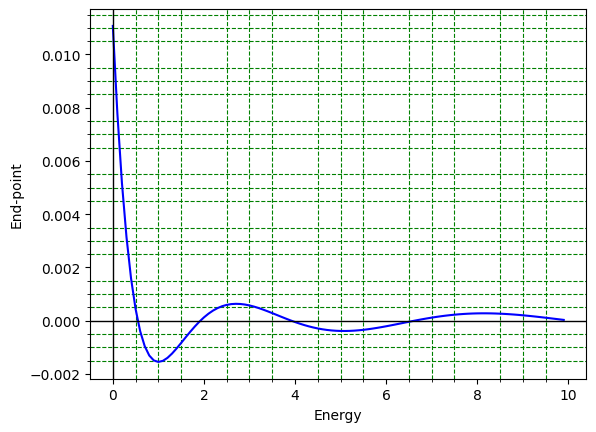

Enter the 1st guess of energy :  1
Enter the 2nd guess of energy :  3


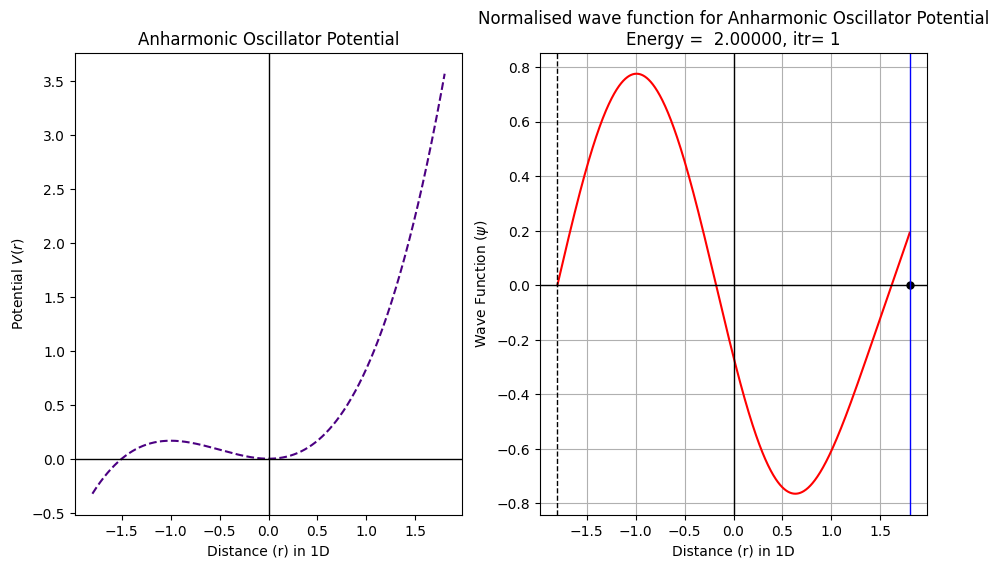

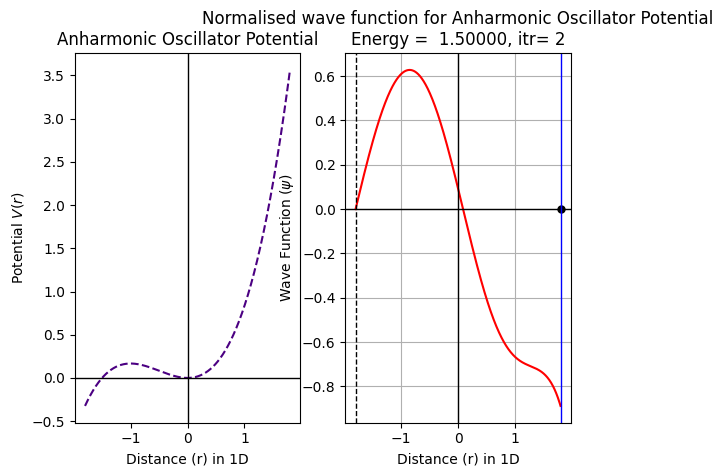

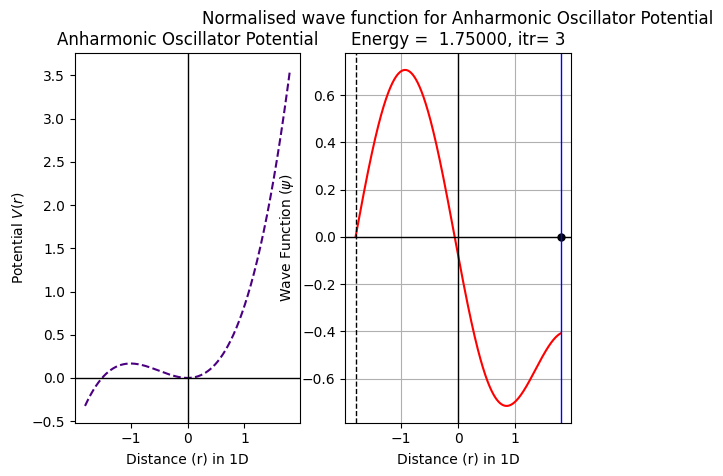

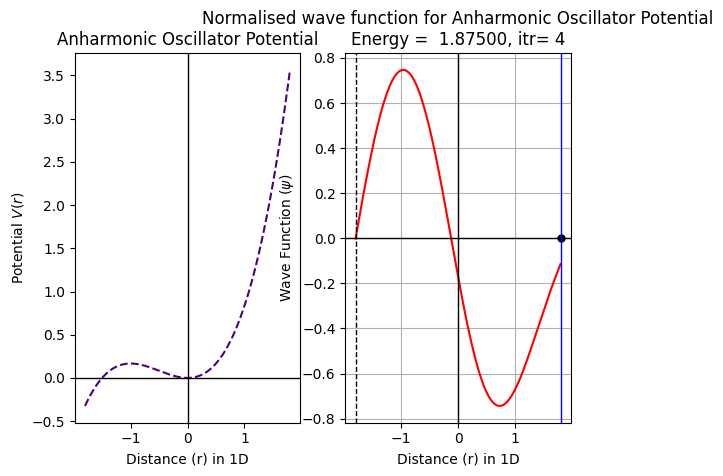

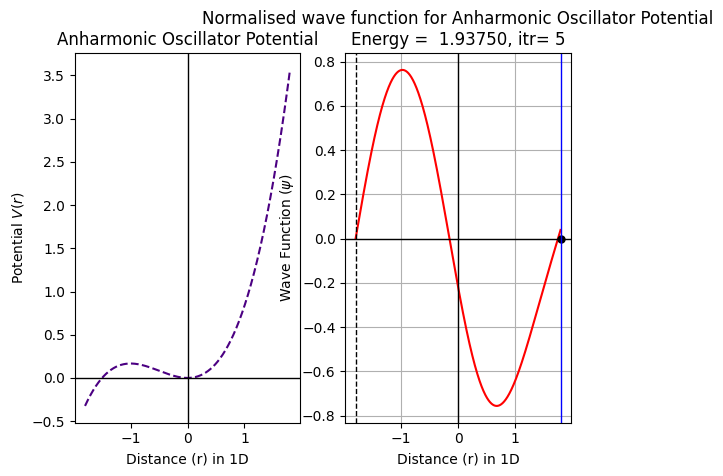

...

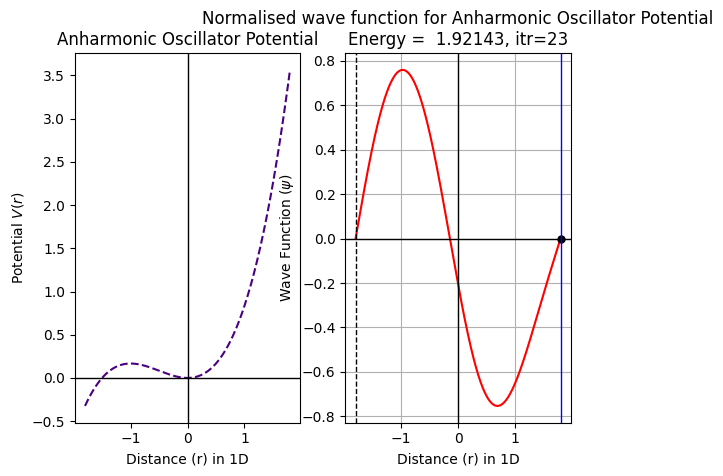

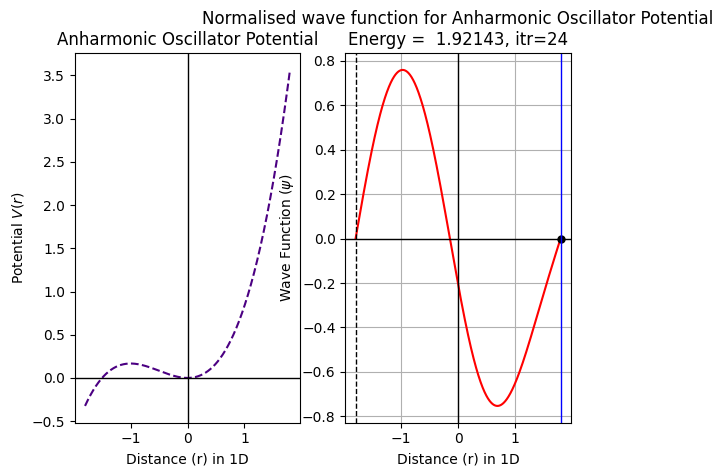

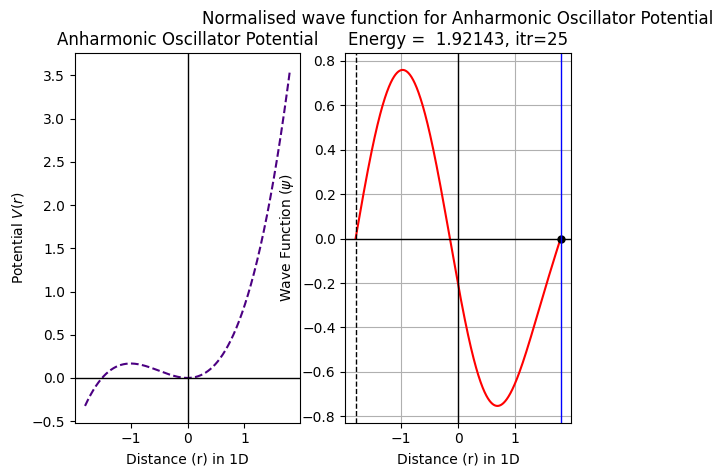

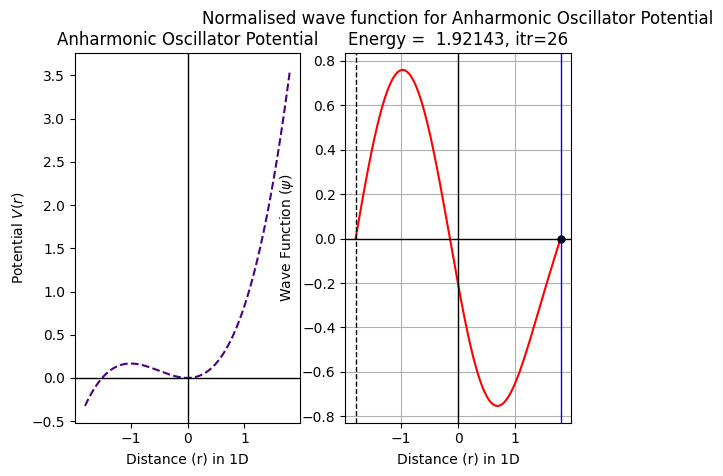

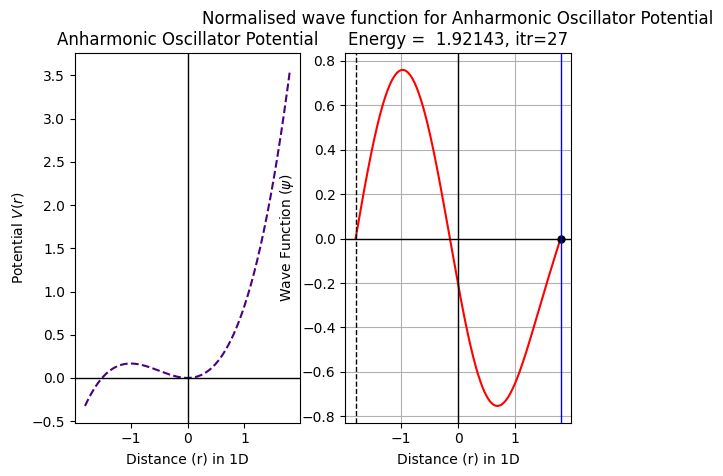

The dimensionless energy satisfying the boundary condition is 1.9214256629347801


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import simpson


#Define the dimensionless potential
def V(r):
    b=1
    k=1
    return (k*r**2)/2+(b*r**3)/3

#Define the dimensionless Time Independent Schrodinger Equation
def psi(r,y,u,E):
    f=-2*(E-V(r))*y
    return f

def phi(r,y,u):
	return u
   
#Boundary conditions for a wave function
r0,y0,rn,yn=-1.8,0,1.8,0
n=1000

#Euler method with shooting parameter E as energy
def AHO(E):
    alpha=0.001          #Initial derivative (can be anything as it doesn't control the solution after normalization)
    r,y,u,R,Y,U=r0,y0,alpha,[r0],[y0],[alpha]
    h=(rn-r0)/n
    for i in range(0,n):   
        y=y+h*phi(r,y,u)
        u=u+h*psi(r,y,u,E)
        r=r+h
        R.append(r)
        Y.append(y)
        U.append(u)
    return R,Y,U


#Guessing energy value from plot
energies=np.arange(0,10,0.1)
H=[]
for i in energies:
    hits=AHO(i)[1][-1]
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()



#Bisection method for proper choice of energy
while True:
    E1=eval(input('Enter the 1st guess of energy : '))
    E2=eval(input('Enter the 2nd guess of energy : '))
    if AHO(E1)[1][-1]*AHO(E2)[1][-1]<0:
        break
    print('Energy does not exist between the guesses\nEnter new guesses')

itr=0.0
plt.figure(figsize=(11,6)) 
while True:
    E3=(E1+E2)/2
    if AHO(E3)[1][-1]==0:
        break
    if AHO(E1)[1][-1]*AHO(E3)[1][-1]>0:
        E1=E3
    else:
        E2=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
    
#Normalisation of wave function
    N=1/np.sqrt(simpson(np.array(AHO(E3)[1])*np.array(AHO(E3)[1]),x=np.array(AHO(E3)[0])))
    solution=N*np.array(AHO(E3)[1])

#Plotting and printing
    plt.subplot(121)
    r=np.array(AHO(E3)[0])
    plt.plot(r,V(r),'--',color='indigo')
    plt.ylabel(r'Potential $V(r)$')
    plt.xlabel('Distance (r) in 1D')
    plt.title('Anharmonic Oscillator Potential')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.plot(np.array(AHO(E3)[0]),solution,'r',lw=1.5)
    plt.plot(AHO(E3)[0][-1],AHO(E3)[1][-1],'o',color='black',ms=5)
    plt.title('Normalised wave function for Anharmonic Oscillator Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance (r) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=r0,color='black',lw=1,ls='--')
    plt.axvline(x=rn,color='blue',lw=1)
    plt.grid()
    plt.pause(0.5)

plt.show()
print('The dimensionless energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Coulomb potential
Modified Euler Method (Euler Method gives bad solution)

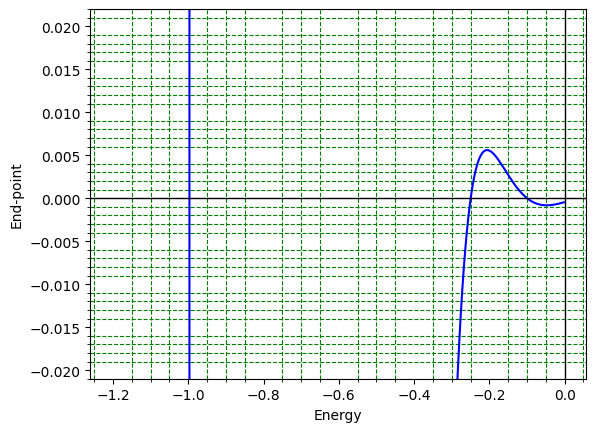

Enter the 1st guess of energy :  -0.4
Enter the 2nd guess of energy :  -0.2


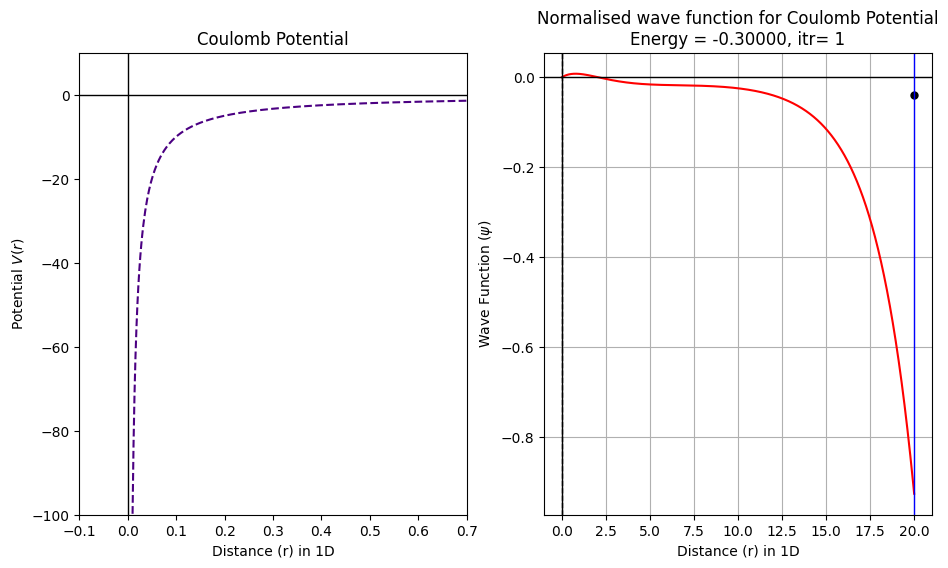

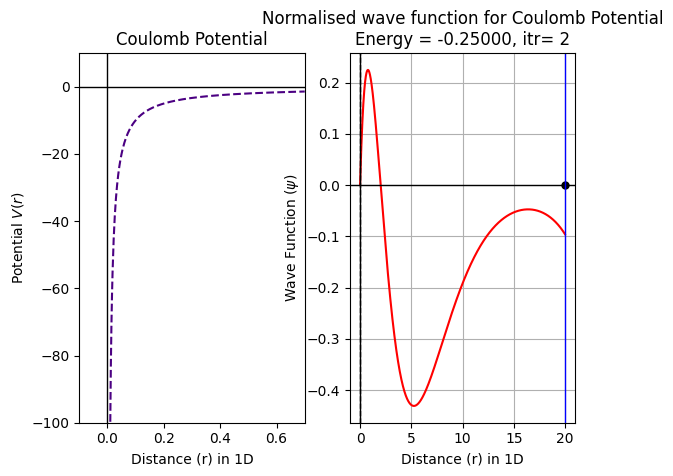

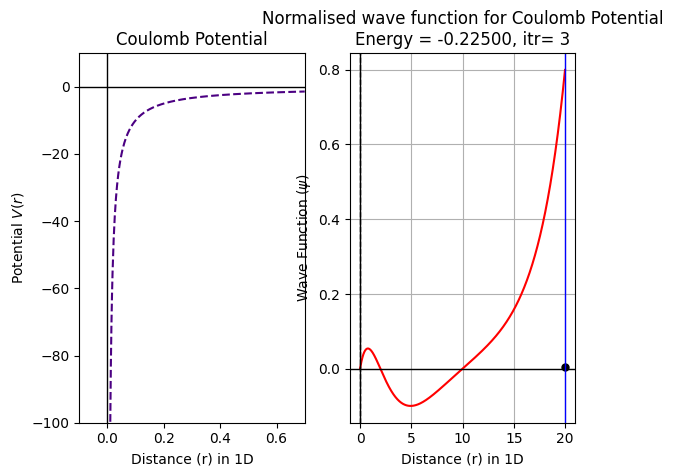

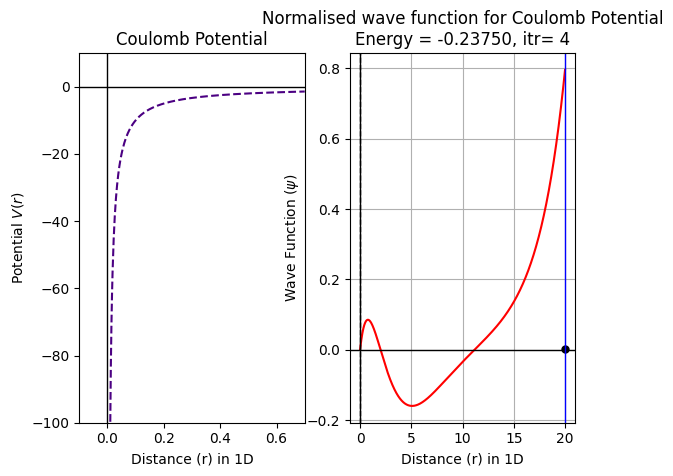

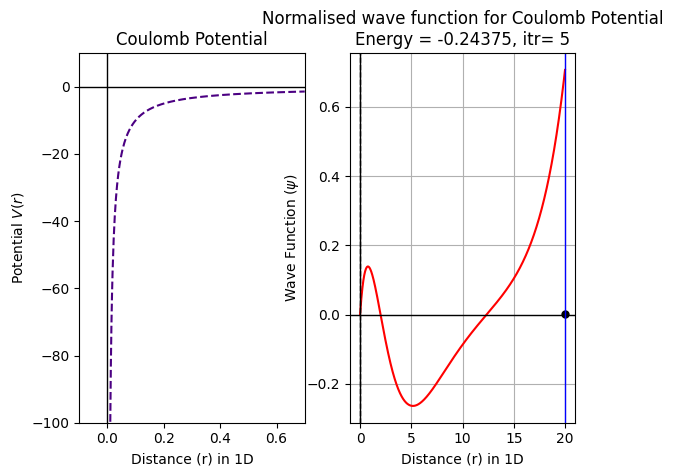

...

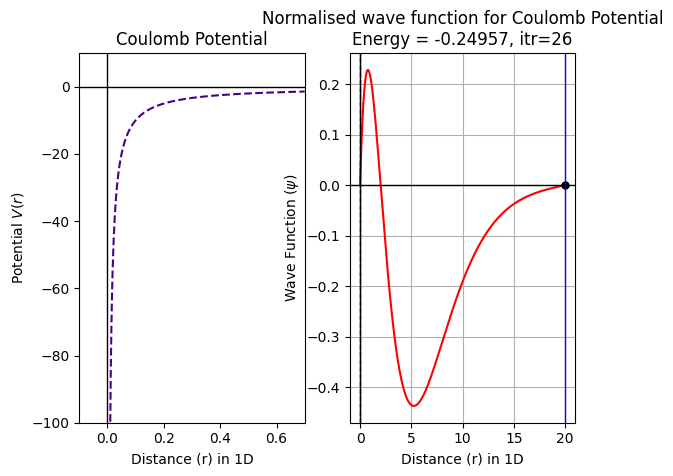

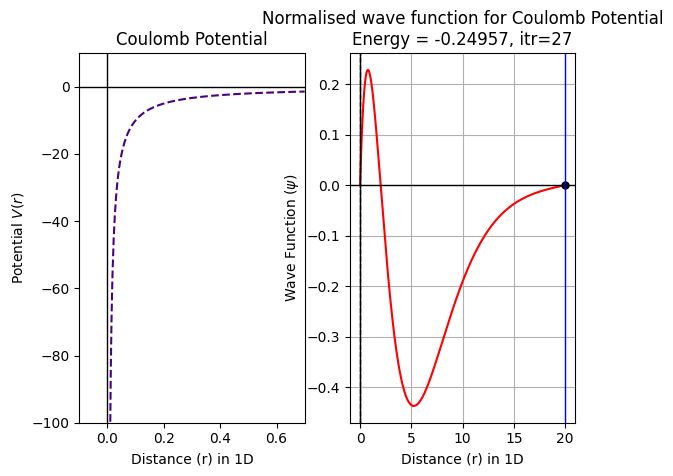

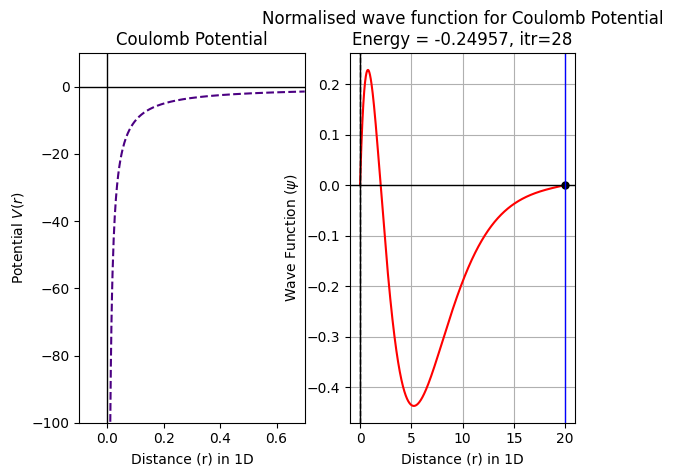

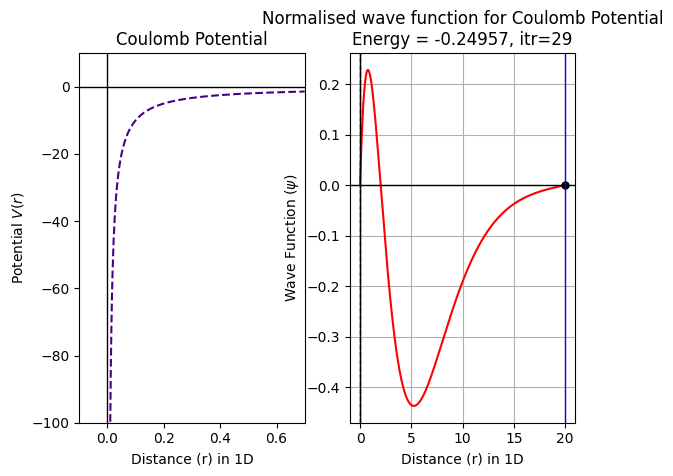

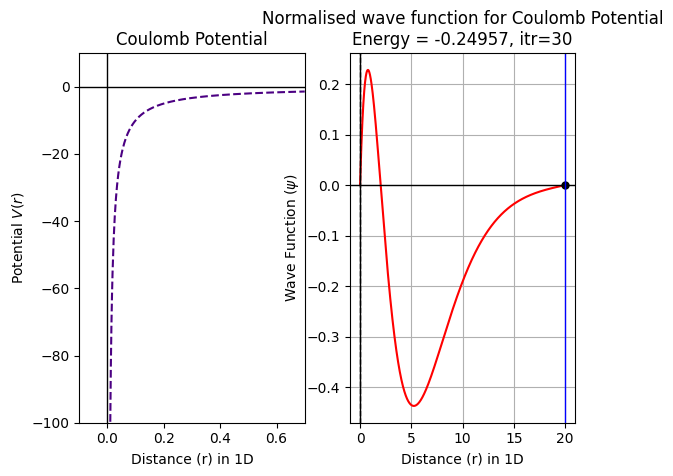

The energy satisfying the boundary condition is -3.3940958147495985 eV


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import simpson


#Define the dimensionless potential
def V(r):
    return -1/r

#Define the dimensionless reduced Time Independent Schrodinger Equation
#y=psi/r, psi is wavefunction
def psi(r,y,u,E):
    f=-2*(E/2-V(r))*y
    return f

def phi(r,y,u):
	return u
   
#Boundary conditions for a wave function
#Boundary Conditions for a wave function 
#Large end point to capture many Coulomb Potential states before infinite well states (positive energies) take over when the system actually responds to the finite boundary conditions for higher excited states
#Larger the boundary, more tolerance required for wavefunction to converge
#Larger the boundary, more error accumulates in RK2 Method which shifts all energy levels
r0,y0,rn,yn=1e-5,0,20,0
#r0,y0,rn,yn=1e-12,0,200,0
n=10000

#Modified Euler method (RK2) with shooting parameter E as energy
def Coulomb(E):
    alpha=0.001          #Initial derivative (can be anything as it doesn't control the solution after normalization)
    r,y,u,R,Y,U=r0,y0,alpha,[r0],[y0],[alpha]
    h=(rn-r0)/n
    for i in range(0,n):   
        y_old=y
        u_old=u
        y=y+h*u
        y_old1=y
        u=u+h*psi(r,y,u,E)
        y=y_old+0.5*h*(phi(r,y_old,u_old)+phi(r+h,y,u))
        u=u_old+0.5*h*(psi(r,y_old,u_old,E)+psi(r+h,y_old1,u,E))
        r=r+h
        R.append(r)
        Y.append(y)
        U.append(u)
    return R,Y,U


#Guessing energy value from plot
#Energies are negative (-1/n**2) with maximum value of -1.0 (scaled system) for the Coulomb Potential
energies=np.arange(-1.2,0,0.002)
H=[]
for i in energies:
    hits=Coulomb(i)[1][-1]
    H.append(hits)
    
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.ylim(-0.021,0.022)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()



#Bisection method for proper choice of energy
while True:
    E1=eval(input('Enter the 1st guess of energy : '))
    E2=eval(input('Enter the 2nd guess of energy : '))
    if Coulomb(E1)[1][-1]*Coulomb(E2)[1][-1]<0:
        break
    print('Energy does not exist between the guesses\nEnter new guesses')

itr=0.0
plt.figure(figsize=(11,6)) 
while True:
    E3=(E1+E2)/2
    if Coulomb(E3)[1][-1]==0:
        break
    if Coulomb(E1)[1][-1]*Coulomb(E3)[1][-1]>0:
        E1=E3
    else:
        E2=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.0000000001:
        break
       
#Normalisation of wave function
    N=1/np.sqrt(simpson(np.array(Coulomb(E3)[1])*np.array(Coulomb(E3)[1]),x=np.array(Coulomb(E3)[0])))
    solution=N*np.array(Coulomb(E3)[1])

#Plotting and printing
    plt.subplot(121)
    r=np.array(Coulomb(E3)[0])
    plt.plot(r,V(r),'--',color='indigo')
    plt.ylabel(r'Potential $V(r)$')
    plt.xlabel('Distance (r) in 1D')
    plt.title('Coulomb Potential')
    plt.xlim(-0.1,0.7)
    plt.ylim(-100,10)
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.plot(r,solution,'r',lw=1.5)
    plt.plot(Coulomb(E3)[0][-1],Coulomb(E3)[1][-1],'o',color='black',ms=5)
    plt.title('Normalised wave function for Coulomb Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance (r) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=r0,color='black',lw=1,ls='--')
    plt.axvline(x=rn,color='blue',lw=1)
    plt.grid()
    plt.pause(0.5)

plt.show()
print('The energy satisfying the boundary condition is',13.6*E3,'eV')

# Solution of Schrodinger's 1D wave  equation for Yukawa potential
Modified Euler Method (Euler Method gives bad solution)

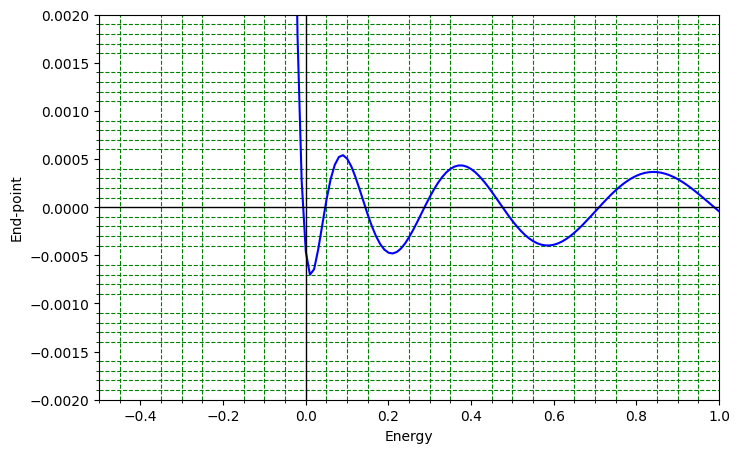

Enter the 1st guess of energy :  -0.1
Enter the 2nd guess of energy :  0


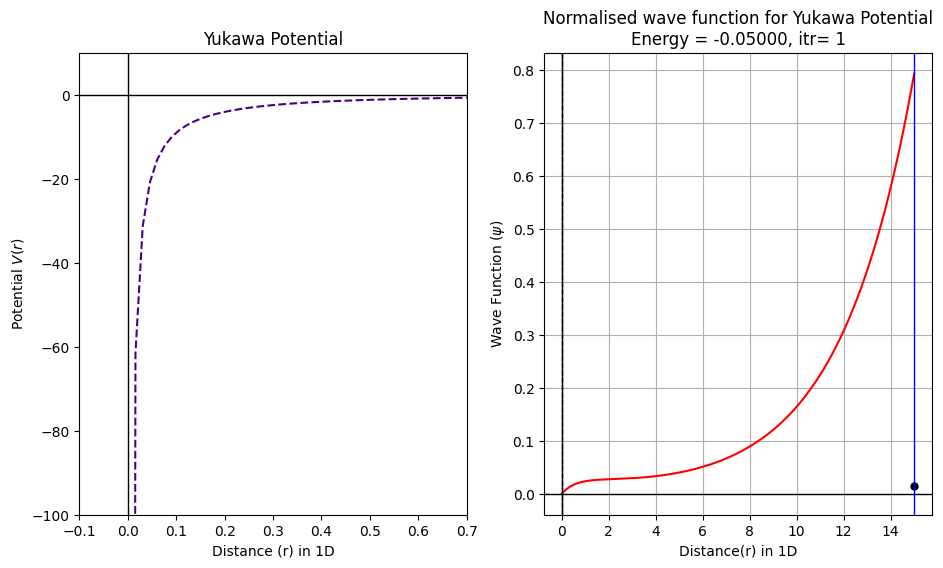

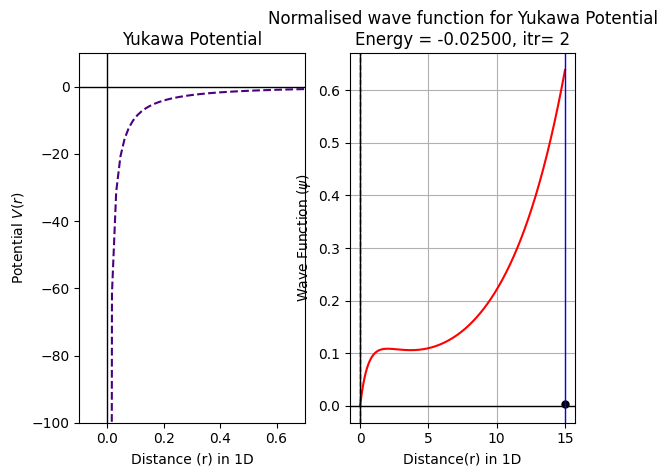

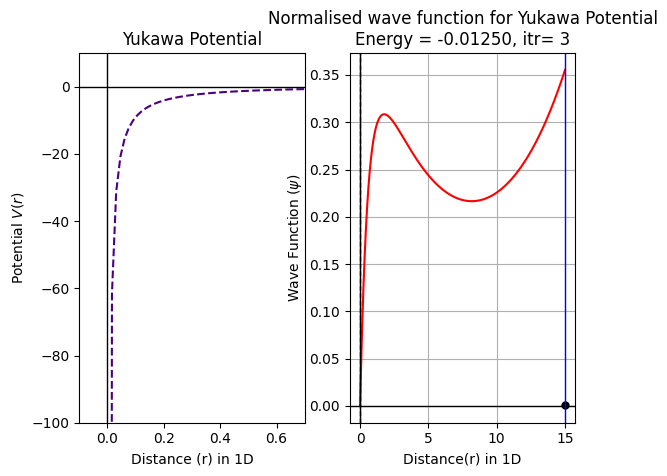

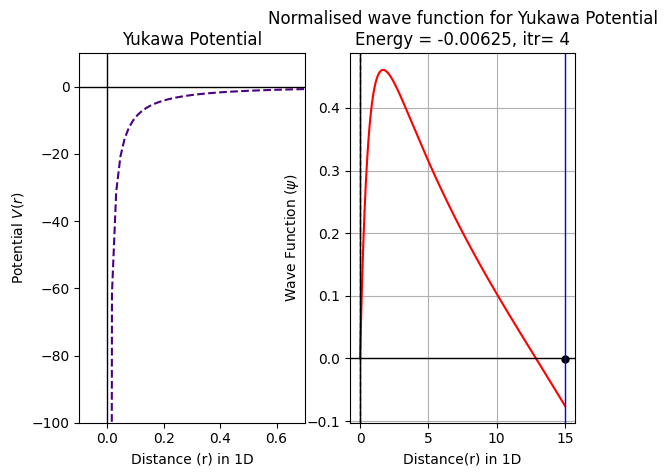

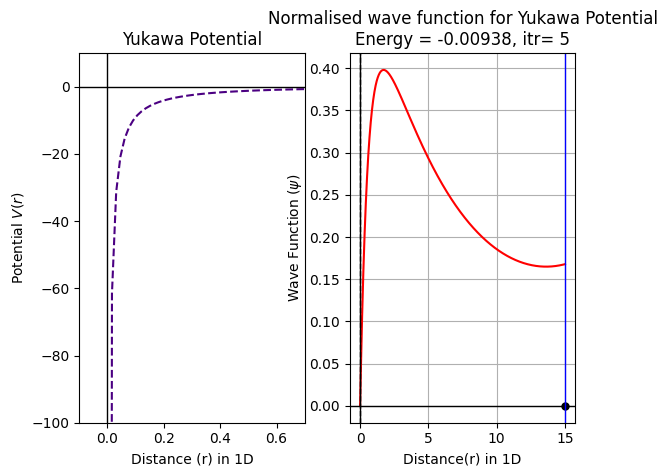

...

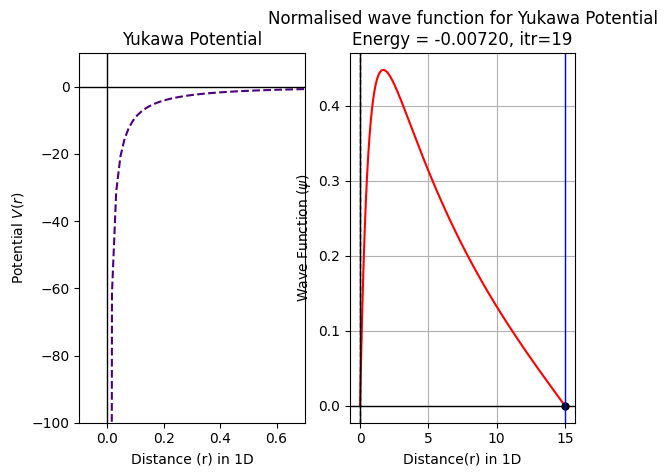

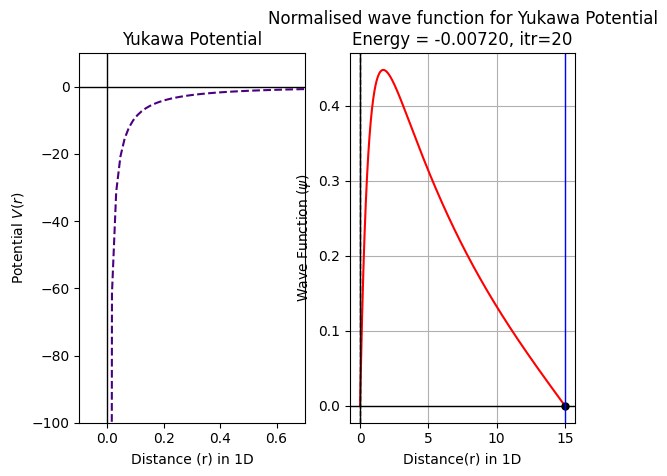

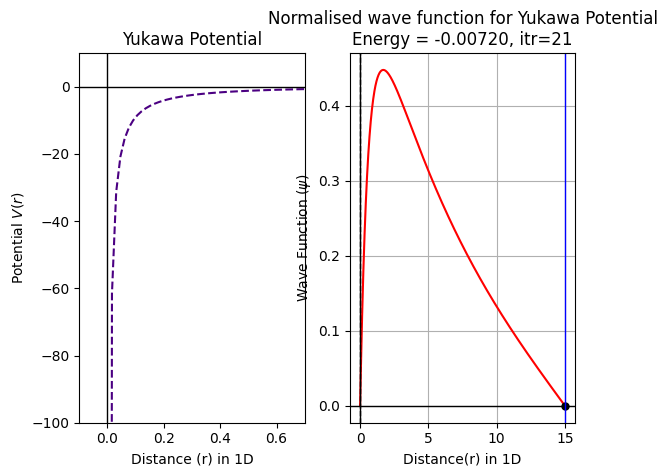

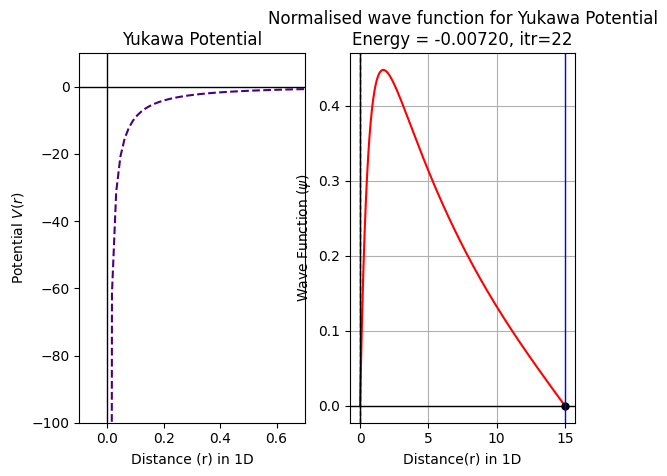

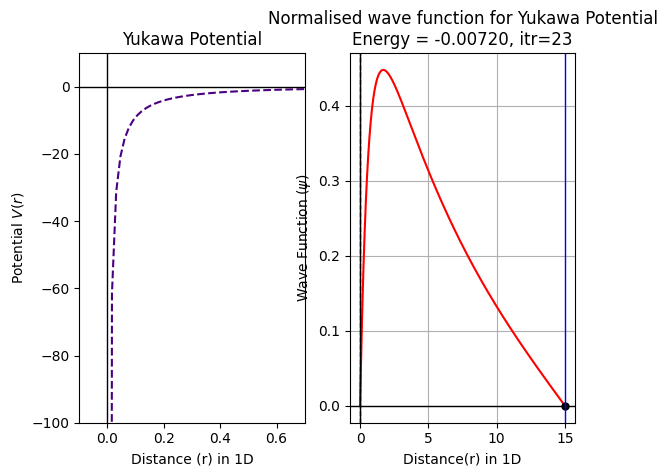

The energy satisfying the boundary condition is -0.0072018921375274665


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import simpson


#Define the dimensionless potential
def V(r):
    b=1
    return -(1/r)*np.exp(-r/b)

#Define the dimensionless Time Independent Schrodinger Equation
def psi(r,y,u,E):
    f=-2*(E-V(r))*y
    return f

def phi(r,y,u):
	return u
   
#Boundary conditions for a wave function
r0,y0,rn,yn=0.001,0,15,0
n=1000

#Modified Euler method with shooting parameter E as energy
def Yukawa(E):
    alpha=0.001        #Initial derivative (can be anything as it doesn't control the solution after normalization)
    r,y,u,R,Y,U=r0,y0,alpha,[r0],[y0],[alpha]
    h=(rn-r0)/n
    for i in range(0,n):   
        y_old=y
        u_old=u
        y=y+h*u
        y_old1=y
        u=u+h*psi(r,y,u,E)
        y=y_old+0.5*h*(phi(r,y_old,u_old)+phi(r+h,y,u))
        u=u_old+0.5*h*(psi(r,y_old,u_old,E)+psi(r+h,y_old1,u,E))
        r=r+h
        R.append(r)
        Y.append(y)
        U.append(u)
    return R,Y,U


#Guessing energy value from plot
#Energies are negative (but finite) if Yukawa Potential supports bound states but the system here allows positive energies for bound states  as it is bounded from both ends with infinite potential at finite distance
energies=np.arange(-10,10,0.01)
H=[]
for i in energies:
    hits=Yukawa(i)[1][-1]
    H.append(hits)
   
plt.figure(figsize=(8,5)) 
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.xlim(-0.5,1)
plt.ylim(-0.002,0.002)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()



#Bisection method for proper choice of energy
while True:
    E1=eval(input('Enter the 1st guess of energy : '))
    E2=eval(input('Enter the 2nd guess of energy : '))
    if Yukawa(E1)[1][-1]*Yukawa(E2)[1][-1]<0:
        break
    print('Energy does not exist between the guesses\nEnter new guesses')

itr=0.0
plt.figure(figsize=(11,6)) 
while True:
    E3=(E1+E2)/2
    if Yukawa(E3)[1][-1]==0:
        break
    if Yukawa(E1)[1][-1]*Yukawa(E3)[1][-1]>0:
        E1=E3
    else:
        E2=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
          
#Normalisation of wave function
    N=1/np.sqrt(simpson(np.array(Yukawa(E3)[1])*np.array(Yukawa(E3)[1]),x=np.array(Yukawa(E3)[0])))
    solution=N*np.array(Yukawa(E3)[1])

#Plotting and printing
    plt.subplot(121)
    r=np.array(Yukawa(E3)[0])
    plt.plot(r,V(r),'--',color='indigo')
    plt.ylabel(r'Potential $V(r)$')
    plt.xlabel('Distance (r) in 1D')
    plt.title('Yukawa Potential')
    plt.ylim(-100,10)
    plt.xlim(-0.1,0.7)
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.plot(np.array(Yukawa(E3)[0]),solution,'r',lw=1.5)
    plt.plot(Yukawa(E3)[0][-1],Yukawa(E3)[1][-1],'o',color='black',ms=5)
    plt.title('Normalised wave function for Yukawa Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(r) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=r0,color='black',lw=1,ls='--')
    plt.axvline(x=rn,color='blue',lw=1)
    plt.grid()
    plt.pause(0.5)

plt.show()
print('The energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Morse potential
Euler Method

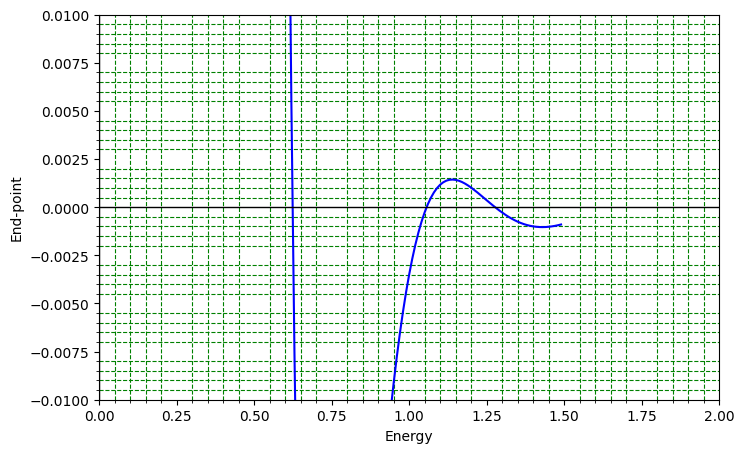

Enter the 1st guess of energy :  0.85
Enter the 2nd guess of energy :  1.15


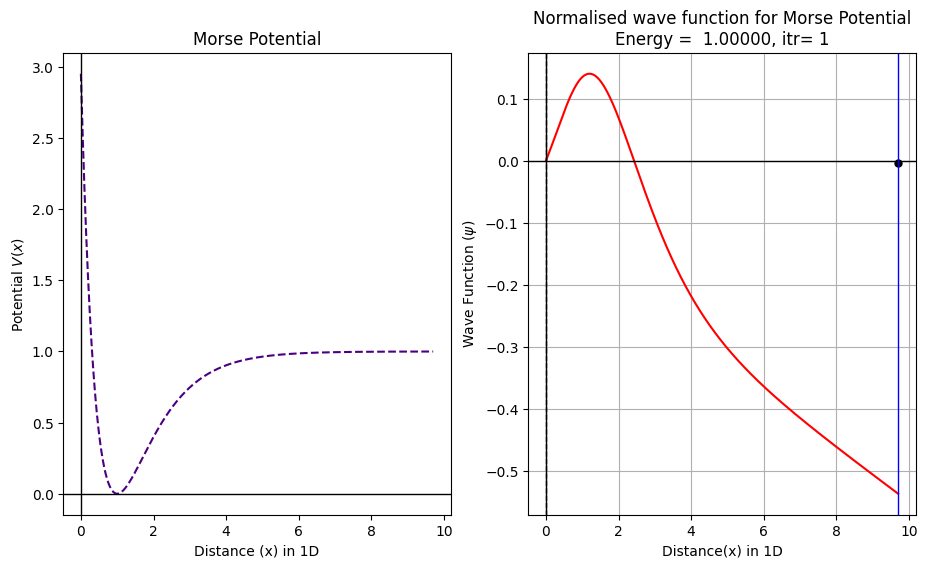

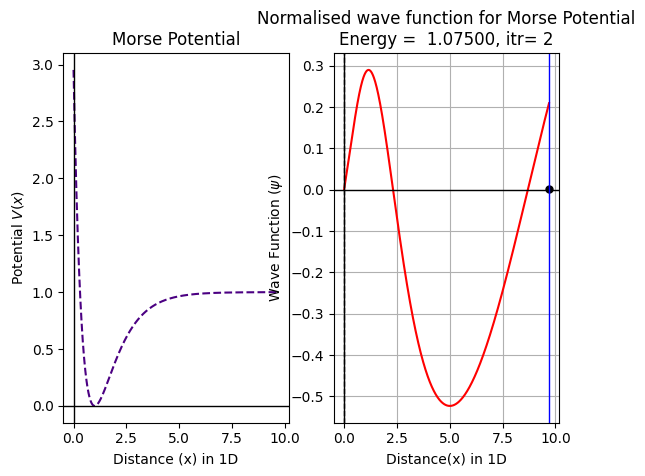

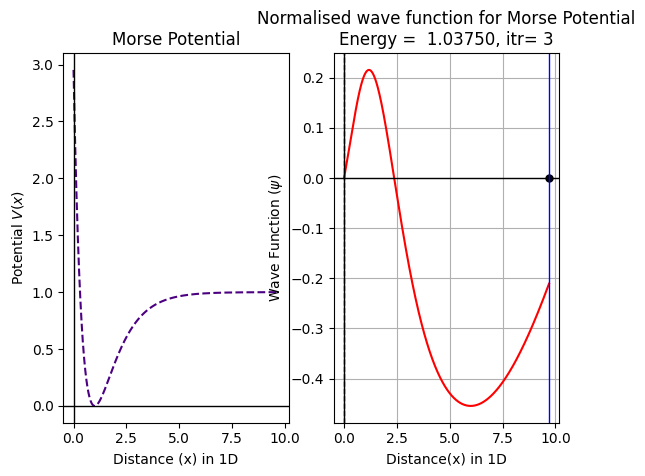

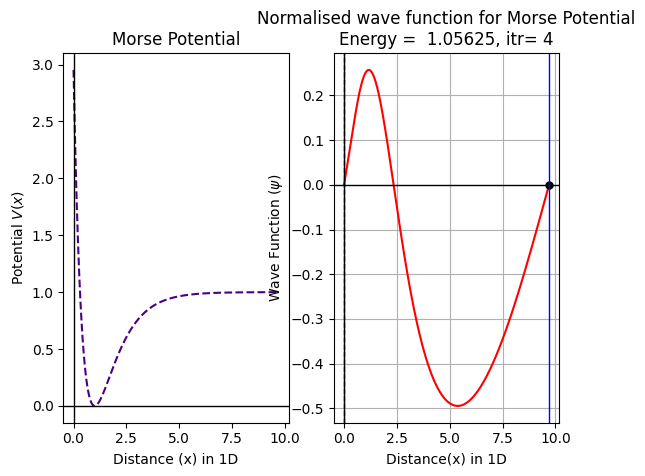

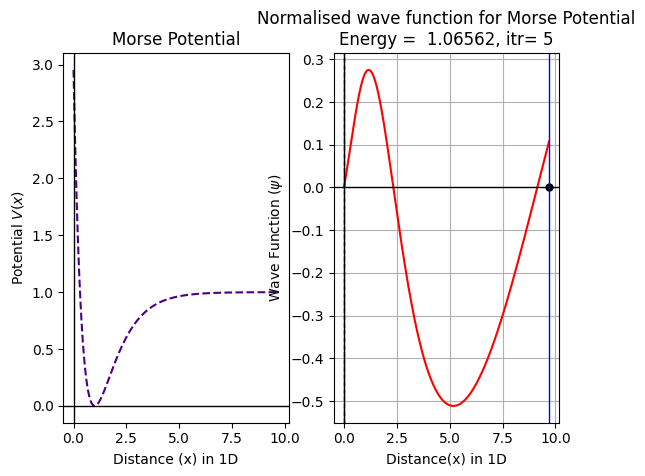

...

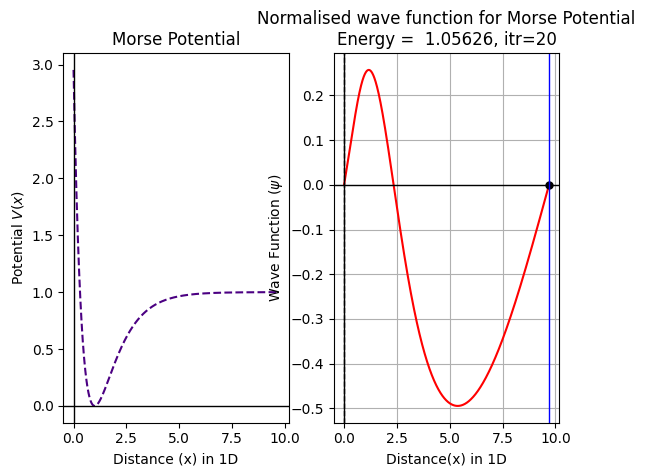

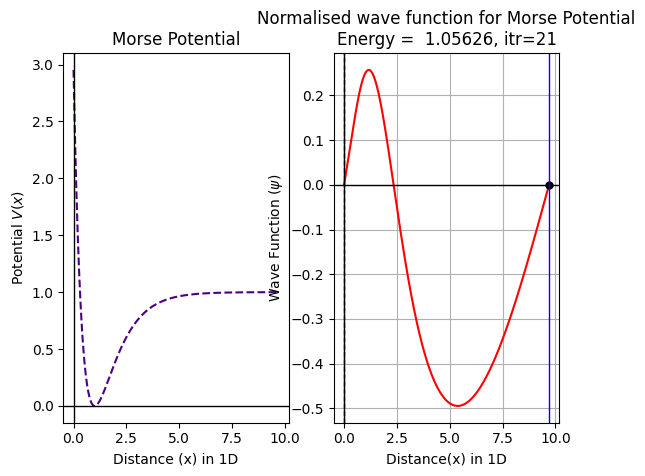

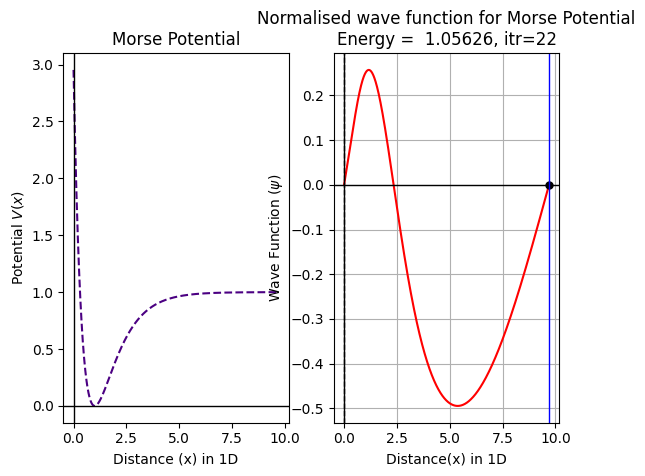

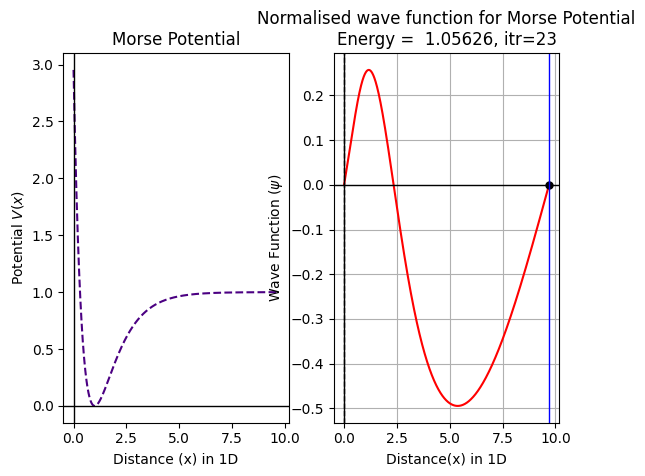

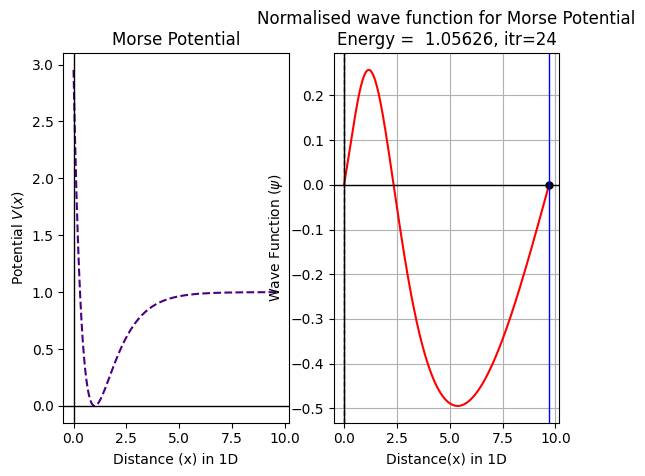

The dimensionless energy satisfying the boundary condition is 1.0562571972608565


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import simpson


#Define the dimensionless potential
def V(x):
    D=1
    b=1
    return D*(1-np.exp(-(x-b)))**2 

#Define the dimensionless Time Independent Schrodinger Equation
def psi(x,y,u,E):
    f=-2*(E-V(x))*y
    return f

def phi(x,y,u):
	return u
   
#Boundary conditions for a wave function
x0,y0,xn,yn=0,0,9.7,0
n=1000

#Euler method with Morseoting parameter E as energy
def Morse(E):
    alpha=0.001          #Initial derivative (can be anything as it doesn't control the solution after normalization)
    x,y,u,X,Y,U=x0,y0,alpha,[x0],[y0],[alpha]
    h=(xn-x0)/n
    for i in range(0,n):   
        y=y+h*phi(x,y,u)
        u=u+h*psi(x,y,u,E)
        x=x+h
        X.append(x)
        Y.append(y)
        U.append(u)
    return X,Y,U


#Guessing energy value from plot
energies=np.arange(0,1.5,0.01)
H=[]
for i in energies:
    hits=Morse(i)[1][-1]
    H.append(hits)

plt.figure(figsize=(8,5))     
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.ylim(-0.01,0.01)
plt.xlim(0,2)
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()



#Bisection method for proper choice of energy
while True:
    E1=eval(input('Enter the 1st guess of energy : '))
    E2=eval(input('Enter the 2nd guess of energy : '))
    if Morse(E1)[1][-1]*Morse(E2)[1][-1]<0:
        break
    print('Energy does not exist between the guesses\nEnter new guesses')

itr=0.0
plt.figure(figsize=(11,6)) 
while True:
    E3=(E1+E2)/2
    if Morse(E3)[1][-1]==0:
        break
    if Morse(E1)[1][-1]*Morse(E3)[1][-1]>0:
        E1=E3
    else:
        E2=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
          
#Normalisation of wave function
    N=1/np.sqrt(simpson(np.array(Morse(E3)[1])*np.array(Morse(E3)[1]),x=np.array(Morse(E3)[0])))
    solution=N*np.array(Morse(E3)[1])

#Plotting and printing
    plt.subplot(121)
    x=np.array(Morse(E3)[0])
    plt.plot(x,V(x),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('Morse Potential')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.plot(np.array(Morse(E3)[0]),solution,'r',lw=1.5)
    plt.plot(Morse(E3)[0][-1],Morse(E3)[1][-1],'o',color='black',ms=5)
    plt.title('Normalised wave function for Morse Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.axvline(x=xn,color='blue',lw=1)
    plt.grid()
    plt.pause(0.5)

plt.show()
print('The dimensionless energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Square Well potential
Euler Method

Enter the width of the potential well :  5
Enter the well potential :  0


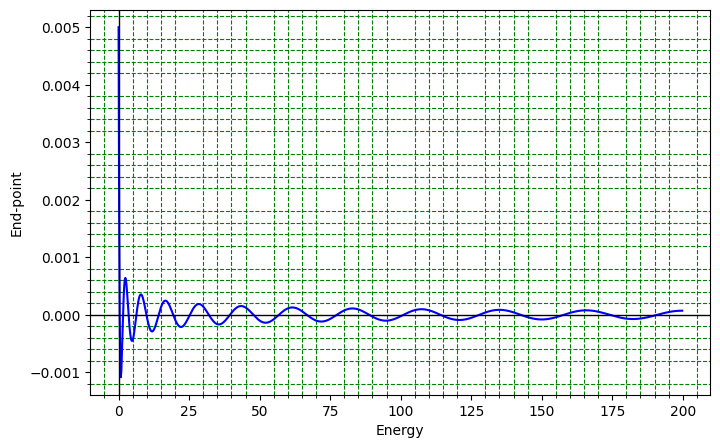

Enter the 1st guess of energy :  0
Enter the 2nd guess of energy :  0.01


Energy does not exist between the guesses
Enter new guesses


Enter the 1st guess of energy :  0
Enter the 2nd guess of energy :  0.1


Energy does not exist between the guesses
Enter new guesses


Enter the 1st guess of energy :  0
Enter the 2nd guess of energy :  1


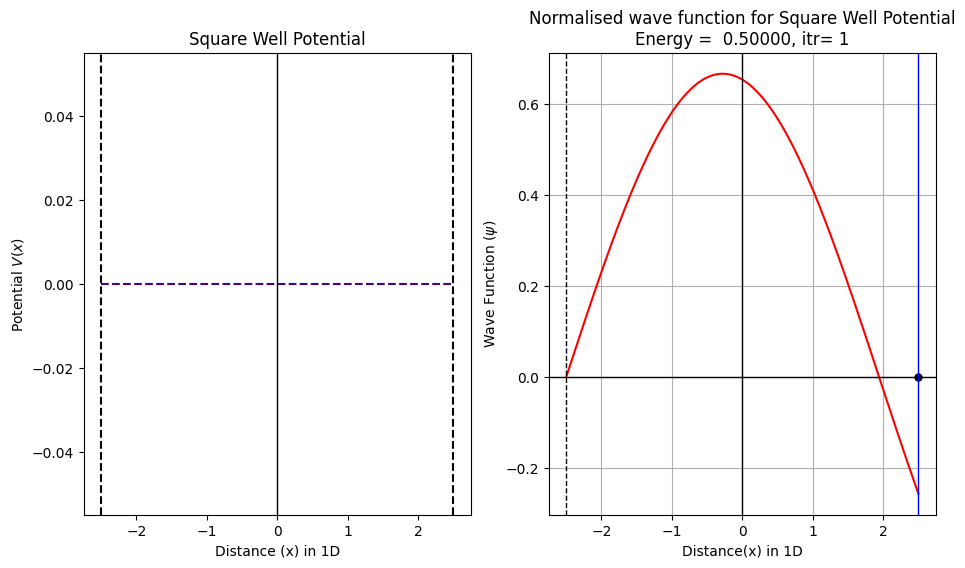

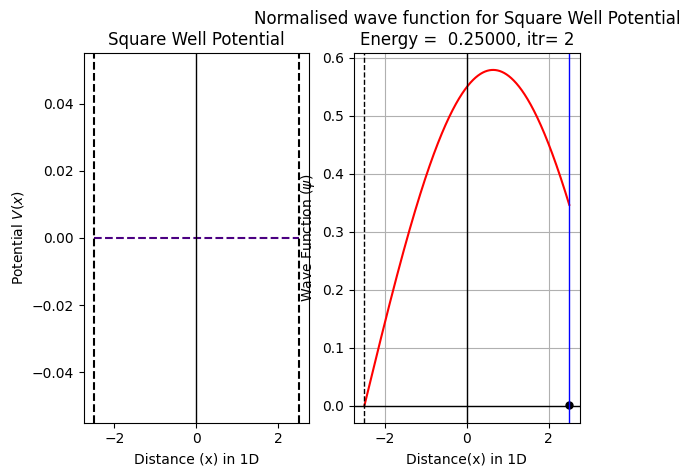

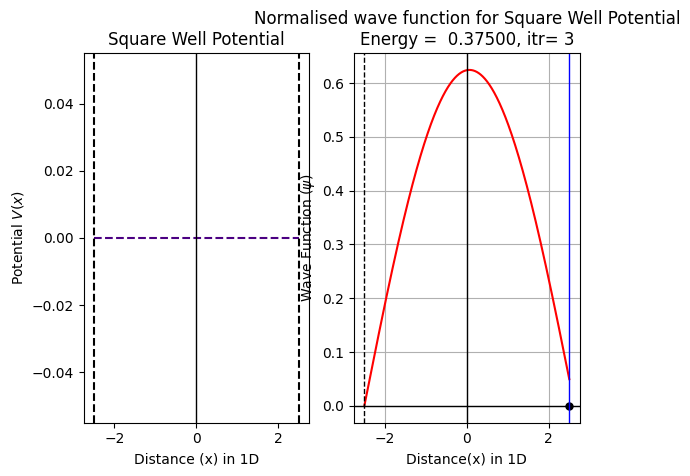

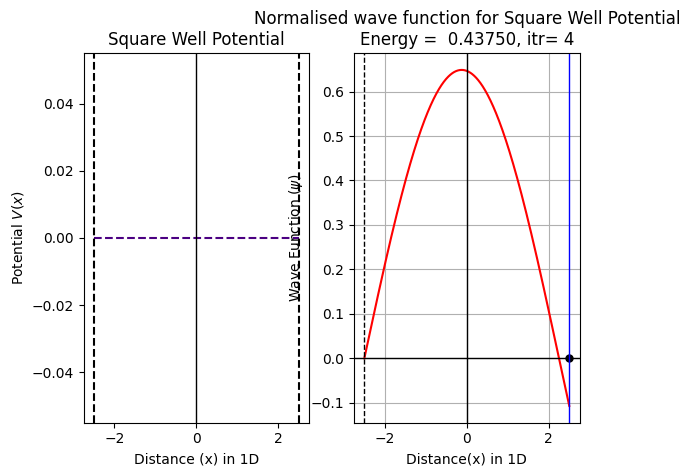

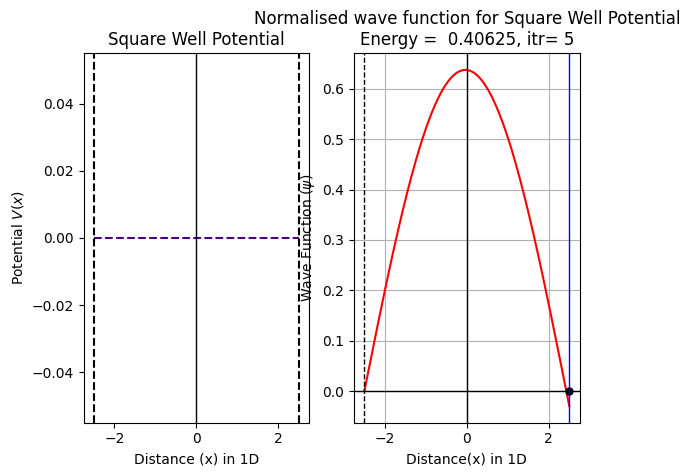

...

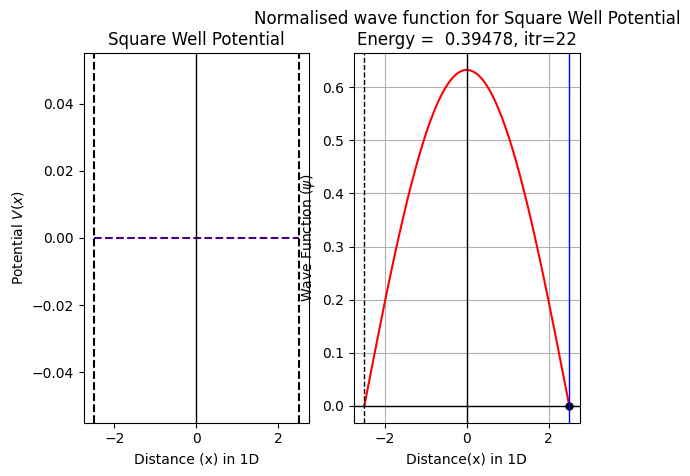

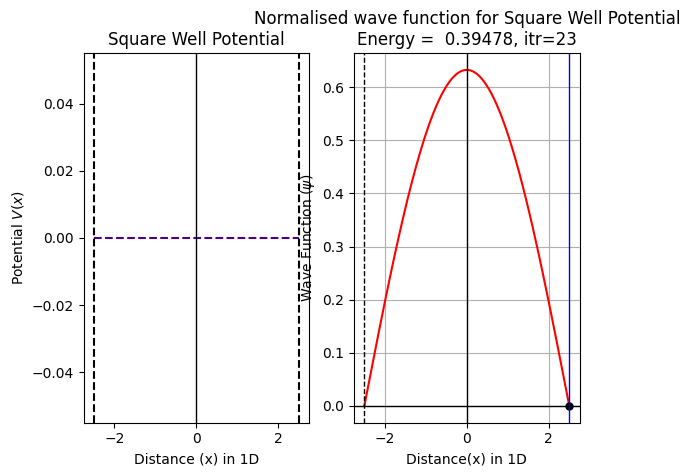

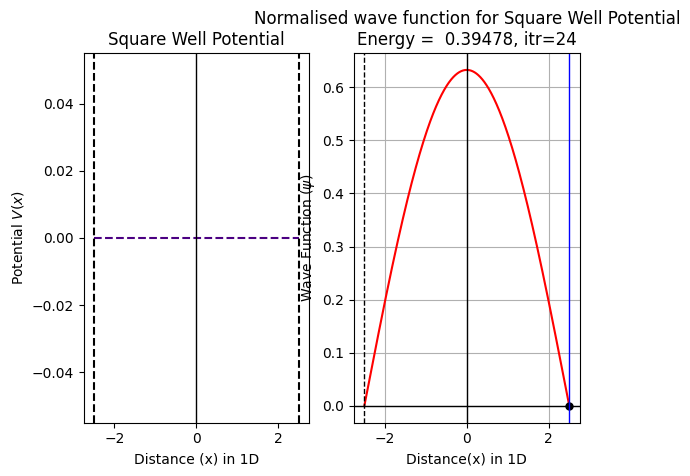

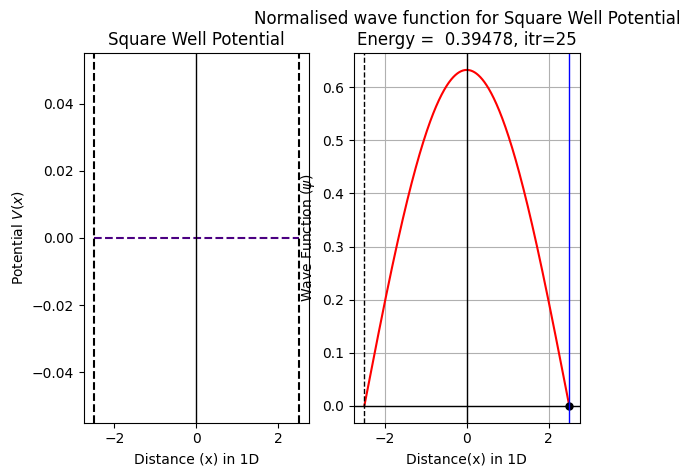

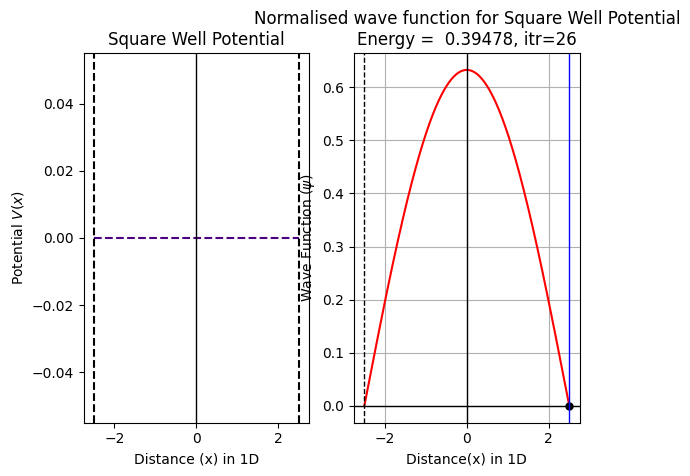

The energy satisfying the boundary condition is 0.3947838470339775


In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import simpson


#Define the dimensionless potential
def V(x,a,V0):
    k=0
    return k*(x)-V0

a=eval(input('Enter the width of the potential well : ' ))
V0=eval(input('Enter the well potential : ' ))
V0=abs(V0)

#Define the dimensionless Time Independent Schrodinger Equation
def psi(x,y,u,E):
    f=-(E-V(x,a,V0))*y
    return f

def phi(x,y,u):
	return u
   
#Boundary conditions for a wave function
x0,y0,xn,yn=-a/2,0,a/2,0
n=1000

#Euler method with shooting parameter E as energy
def square(E):
    alpha=0.001          #Initial derivative (can be anything as it doesn't control the solution after normalization)
    x,y,u,X,Y,U=x0,y0,alpha,[x0],[y0],[alpha]
    h=(xn-x0)/n
    for i in range(0,n):   
        y=y+h*phi(x,y,u)
        u=u+h*psi(x,y,u,E)
        x=x+h
        X.append(x)
        Y.append(y)
        U.append(u)
    return X,Y,U


#Guessing energy value from plot
energies=np.arange(0,200,0.2)
H=[]
for i in energies:
    hits=square(i)[1][-1]
    H.append(hits)

plt.figure(figsize=(8,5))     
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()


#Bisection method for proper choice of energy
while True:
    E1=eval(input('Enter the 1st guess of energy : '))
    E2=eval(input('Enter the 2nd guess of energy : '))
    if square(E1)[1][-1]*square(E2)[1][-1]<0:
        break
    print('Energy does not exist between the guesses\nEnter new guesses')

itr=0.0
plt.figure(figsize=(11,6)) 
while True:
    E3=(E1+E2)/2
    if square(E3)[1][-1]==0:
        break
    if square(E1)[1][-1]*square(E3)[1][-1]>0:
        E1=E3
    else:
        E2=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
          
#Normalisation of wave function
    N=1/np.sqrt(simpson(np.array(square(E3)[1])*np.array(square(E3)[1]),np.array(square(E3)[0])))
    solution=N*np.array(square(E3)[1])

#Plotting and printing
    plt.subplot(121)
    x=np.array(square(E3)[0])
    plt.plot(x,V(x,a,V0),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('Square Well Potential')
    plt.axvline(color='black',lw=1)
    plt.axvline(x=-a/2,color='black',ls='--')
    plt.axvline(x=a/2,color='black',ls='--')
    
    plt.subplot(122)
    plt.cla()
    plt.plot(np.array(square(E3)[0]),solution,'r',lw=1.5)
    plt.plot(square(E3)[0][-1],square(E3)[1][-1],'o',color='black',ms=5)
    plt.title('Normalised wave function for Square Well Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.axvline(x=xn,color='blue',lw=1)
    plt.grid()
    plt.pause(0.5)

plt.show()
print('The energy satisfying the boundary condition is',E3)

# Solution of Schrodinger's 1D wave equation for Triangular potential
Euler Method

Enter the width of the Triangular well :  5
Enter the slope of the potential :  1


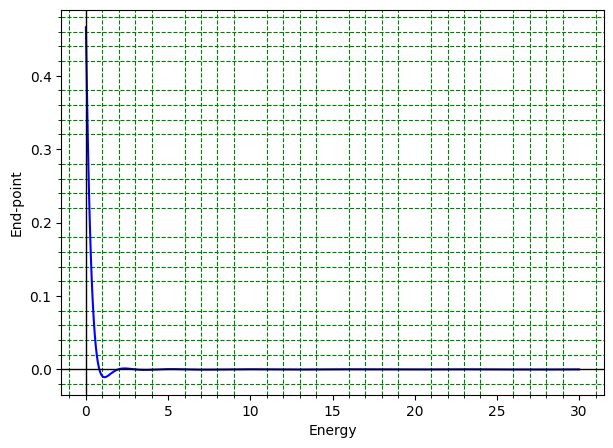

Enter the 1st guess of energy :  0
Enter the 2nd guess of energy :  1


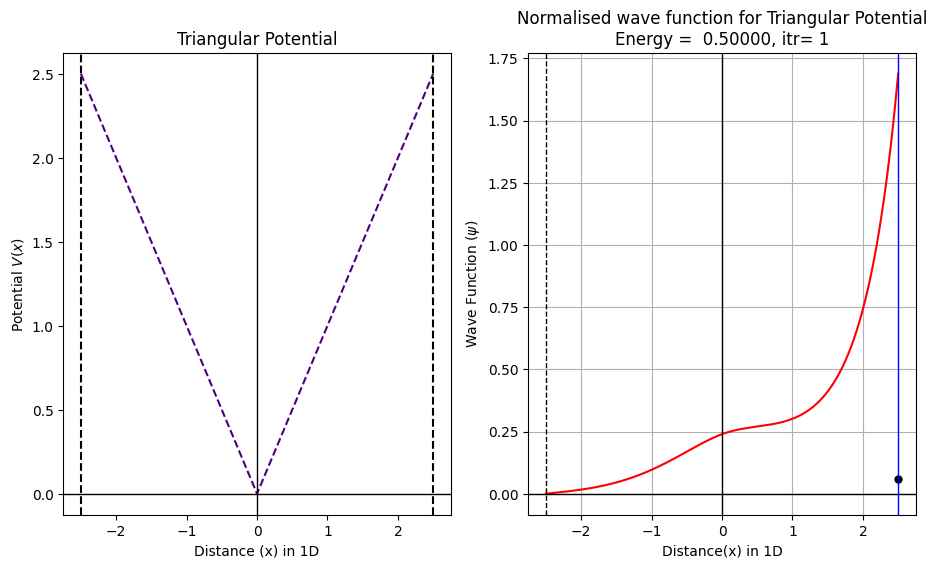

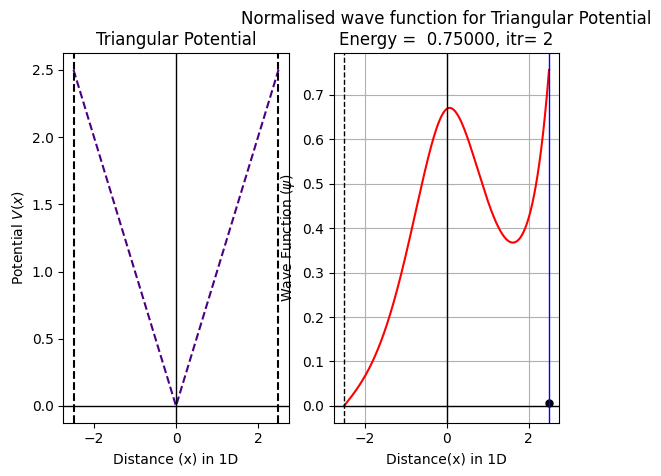

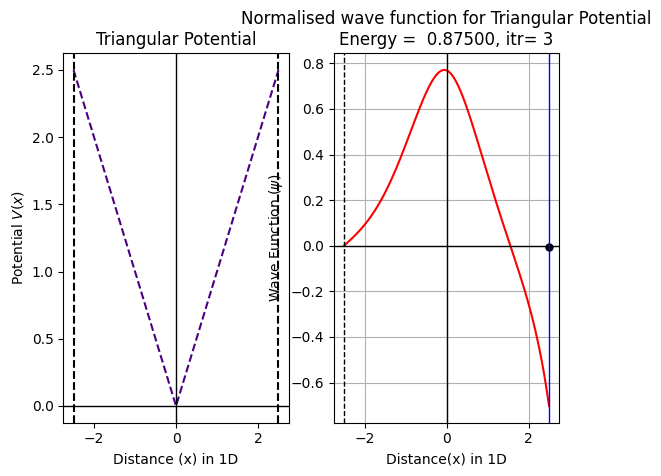

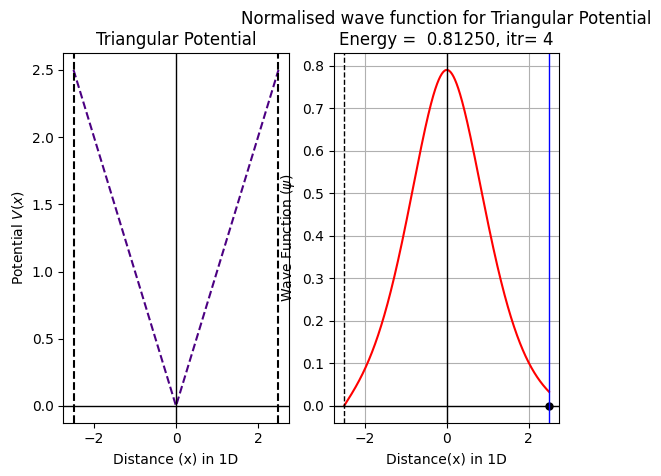

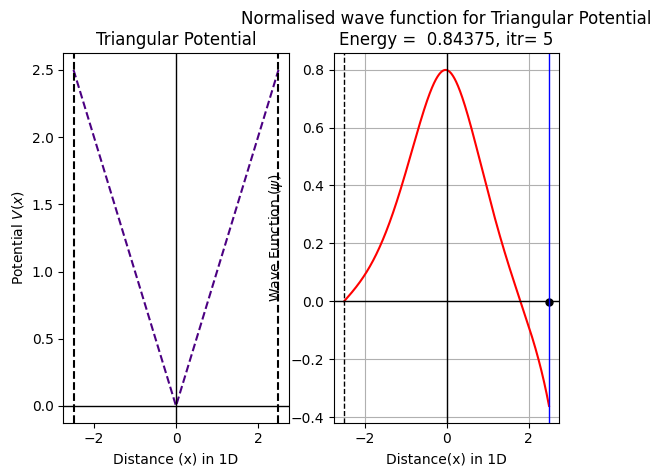

...

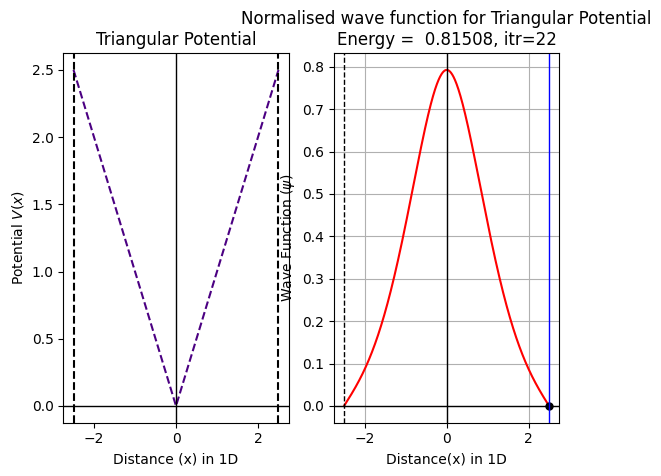

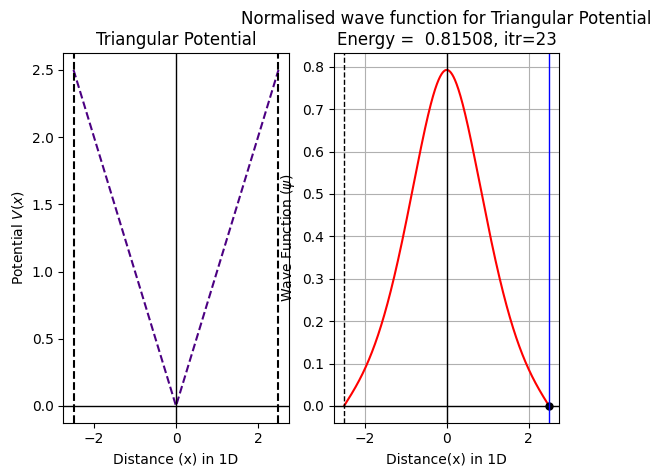

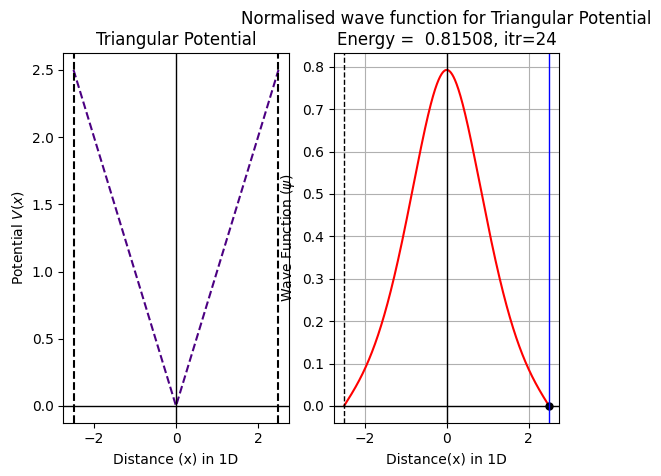

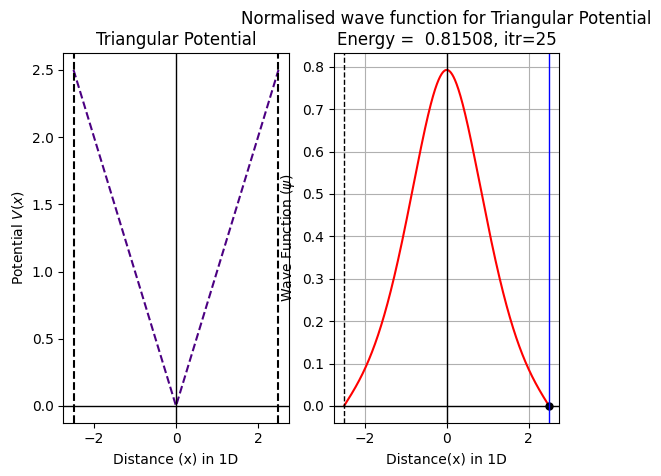

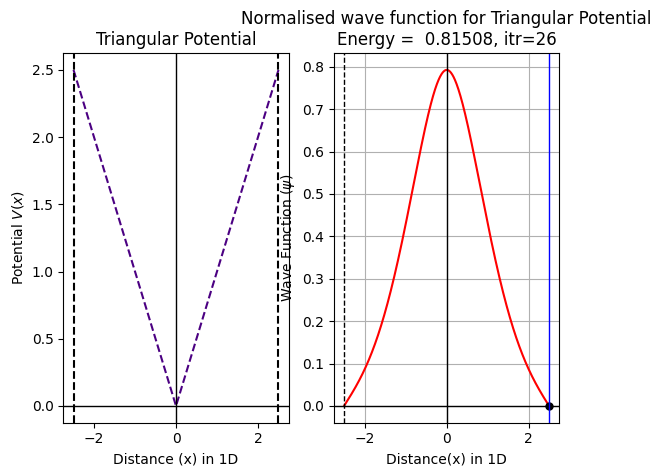

The energy satisfying the boundary condition is 0.8150761500000954


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import simpson


#Define the dimensionless potential
def V(k,x):
        return k*abs(x)

a=eval(input('Enter the width of the Triangular well : ' ))
k=eval(input('Enter the slope of the potential : '))
k=abs(k)

#Define the dimensionless Time Independent Schrodinger Equation
def psi(x,y,u,E):
    f=-2*(E-V(k,x))*y
    return f

def phi(x,y,u):
	return u
   
#Boundary conditions for a wave function
x0,y0,xn,yn=-a/2,0,a/2,0
n=1000

#Euler method with shooting parameter E as energy
def triang(E):
    alpha=0.001       #Initial derivative (can be anything as it doesn't control the solution after normalization)
    x,y,u,X,Y,U=x0,y0,alpha,[x0],[y0],[alpha]
    h=(xn-x0)/n
    for i in range(0,n):   
        y=y+h*phi(x,y,u)
        u=u+h*psi(x,y,u,E)
        x=x+h
        X.append(x)
        Y.append(y)
        U.append(u)
    return X,Y,U


#Guessing energy value from plot
energies=np.linspace(0,30,1000)
H=[]
for i in energies:
    hits=triang(i)[1][-1]
    H.append(hits)

plt.figure(figsize=(7,5))     
plt.plot(energies,H,'b-')
plt.axhline(color='black',lw=1)
plt.axvline(color='black',lw=1)
plt.xlabel('Energy')
plt.ylabel('End-point')
plt.minorticks_on()
plt.grid(which='minor',color='green',ls='--')
plt.show()



#Bisection method for proper choice of energy
while True:
    E1=eval(input('Enter the 1st guess of energy : '))
    E2=eval(input('Enter the 2nd guess of energy : '))
    if triang(E1)[1][-1]*triang(E2)[1][-1]<0:
        break
    print('Energy does not exist between the guesses\nEnter new guesses')

itr=0.0
plt.figure(figsize=(11,6)) 
while True:
    E3=(E1+E2)/2
    if triang(E3)[1][-1]==0:
        break
    if triang(E1)[1][-1]*triang(E3)[1][-1]>0:
        E1=E3
    else:
        E2=E3
    itr=itr+1
    acc=abs(E1-E2)
    if acc<0.00000001:
        break
          
#Normalisation of wave function
    N=1/np.sqrt(simpson(np.array(triang(E3)[1])*np.array(triang(E3)[1]),x=np.array(triang(E3)[0])))
    solution=N*np.array(triang(E3)[1])

#Plotting and printing
    plt.subplot(121)
    x=np.array(triang(E3)[0])
    plt.plot(x,V(k,x),'--',color='indigo')
    plt.ylabel(r'Potential $V(x)$')
    plt.xlabel('Distance (x) in 1D')
    plt.title('Triangular Potential')
    plt.axvline(x=-a/2,color='black',ls='--')
    plt.axvline(x=a/2,color='black',ls='--')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    
    plt.subplot(122)
    plt.cla()
    plt.plot(np.array(triang(E3)[0]),solution,'r',lw=1.5)
    plt.plot(triang(E3)[0][-1],triang(E3)[1][-1],'o',color='black',ms=5)
    plt.title('Normalised wave function for Triangular Potential\n'+r'Energy =%9.5f, itr=%2i'%(E3,itr))
    plt.xlabel('Distance(x) in 1D')
    plt.ylabel(r'Wave Function ($\psi$)')
    plt.axhline(color='black',lw=1)
    plt.axvline(color='black',lw=1)
    plt.axvline(x=x0,color='black',lw=1,ls='--')
    plt.axvline(x=xn,color='blue',lw=1)
    plt.grid()
    plt.pause(0.5)

plt.show()
print('The energy satisfying the boundary condition is',E3)